In [50]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import plotly.express as px
import seaborn as sns
from sklearn.model_selection import train_test_split

In [2]:
df_90 = pd.read_csv('dataset-of-90s.csv')
df_10 = pd.read_csv('dataset-of-10s.csv')
df_00 = pd.read_csv('dataset-of-00s.csv')

In [3]:
# Juntar os 3 dataset
df = pd.concat([df_90, df_10, df_00])

In [4]:
#Ver as primeiras linhas do df
df.head()

,track,artist,uri,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target
0,Misty Roses,Astrud Gilberto,spotify:track:50RBM1j1Dw7WYmsGsWg9Tm,0.527,0.316,1,-15.769,1,0.0310,0.693000,0.00699,0.1680,0.543,116.211,158840,4,53.89523,6,0
1,Never Ever,All Saints,spotify:track:5FTz9qQ94PyUHETyAyfYZN,0.738,0.541,1,-5.485,1,0.0311,0.559000,0.00000,0.0492,0.309,134.187,387573,4,32.16853,16,1
2,Soul Sermon,Gregg Karukas,spotify:track:6m24oe3lk1UMxq9zq4iPFi,0.736,0.419,0,-10.662,1,0.0300,0.693000,0.49500,0.0809,0.265,93.982,237267,4,42.05369,9,0
3,Clarinet Marmalade - Live,Alton Purnell,spotify:track:5FOXuiLI6knVtgMUjWKj6x,0.565,0.594,5,-13.086,1,0.0646,0.655000,0.92600,0.6750,0.763,114.219,375933,4,80.99693,10,0
4,До смерті і довше - Drum & Base and Rock Remix,Skryabin,spotify:track:6CxyIPTqSPvAPXfrIZczs4,0.513,0.760,4,-10.077,1,0.0355,0.000017,0.00339,0.1530,0.961,153.166,430653,4,25.57331,20,0


In [5]:
#Ver as informações gerais do df
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17790 entries, 0 to 5871
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track             17790 non-null  object 
 1   artist            17790 non-null  object 
 2   uri               17790 non-null  object 
 3   danceability      17790 non-null  float64
 4   energy            17790 non-null  float64
 5   key               17790 non-null  int64  
 6   loudness          17790 non-null  float64
 7   mode              17790 non-null  int64  
 8   speechiness       17790 non-null  float64
 9   acousticness      17790 non-null  float64
 10  instrumentalness  17790 non-null  float64
 11  liveness          17790 non-null  float64
 12  valence           17790 non-null  float64
 13  tempo             17790 non-null  float64
 14  duration_ms       17790 non-null  int64  
 15  time_signature    17790 non-null  int64  
 16  chorus_hit        17790 non-null  float64
 17 

In [6]:
#Ver as distribuição da variavel target em porcentagem 
df['target'].value_counts(normalize=True) * 100

target
0    50.0
1    50.0
Name: proportion, dtype: float64

In [7]:
# Remover linhas duplicadas 
df.drop_duplicates(inplace=True)

In [8]:
df['target'].value_counts(normalize=True) * 100

target
0    50.491003
1    49.508997
Name: proportion, dtype: float64

In [9]:
#Agrupar pelo nome do artista e da musica, para ver se há artistas com musicas duplicadas 
df.groupby(['track', 'artist']).size().sort_values(ascending=False)

track                               artist                             
Falling                             Julee Cruise                           12
Chebika - Claudio Mate Metal Remix  Stefano Patarnello                      8
Feeling Punk - Asle Remix           Todd Terry                              6
Until the Day I Die                 Story Of The Year                       5
Spiegel im Spiegel                  Arvo Pärt                               5
                                                                           ..
Haunt Your House                    Dan Andriano in the Emergency Room      1
Haunted Gate                        David Toop                              1
Havana                              Camila Cabello Featuring Young Thug     1
                                    Kenny G                                 1
雏鹰                                  窒息                                      1
Length: 17362, dtype: int64

In [10]:
#Vou remover as linhas duplicadas nas colunas 'track' e 'artist'
df.drop_duplicates(subset=['track', 'artist'], inplace=True)


In [11]:
df.shape

(17362, 19)

## Análise exploratória dos dados

In [12]:
#Visualizar a analise estatistica dos dados
df.describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target
count,17362.000000,17362.000000,17362.000000,17362.000000,17362.000000,17362.000000,17362.000000,17362.000000,17362.000000,17362.000000,17362.000000,1.736200e+04,17362.000000,17362.000000,17362.000000,17362.000000
mean,0.559870,0.655531,5.268921,-8.367512,0.652690,0.088805,0.240258,0.157993,0.196636,0.485987,121.053554,2.494864e+05,3.922935,40.961421,10.796222,0.502304
std,0.187456,0.246070,3.563097,5.296274,0.476129,0.092833,0.307849,0.308216,0.167168,0.255129,29.910466,1.119325e+05,0.378782,19.960989,4.745484,0.500009
min,0.057600,0.000251,0.000000,-49.253000,0.000000,0.022000,0.000000,0.000000,0.013000,0.000000,34.535000,1.592000e+04,0.000000,0.000000,1.000000,0.000000
25%,0.438000,0.505000,2.000000,-9.919000,0.000000,0.035700,0.009080,0.000000,0.093800,0.278250,97.149000,1.997632e+05,4.000000,27.902040,8.000000,0.000000
50%,0.577000,0.699000,5.000000,-6.912500,1.000000,0.050400,0.082700,0.000045,0.128000,0.487000,119.878000,2.331400e+05,4.000000,36.271890,10.000000,1.000000
75%,0.697000,0.856000,8.000000,-5.036000,1.000000,0.096700,0.378750,0.058800,0.257000,0.690000,140.003000,2.763132e+05,4.000000,48.316010,12.000000,1.000000
max,0.986000,0.999000,11.000000,1.137000,1.000000,0.956000,0.996000,0.998000,0.992000,0.996000,217.872000,4.170227e+06,5.000000,262.615400,169.000000,1.000000


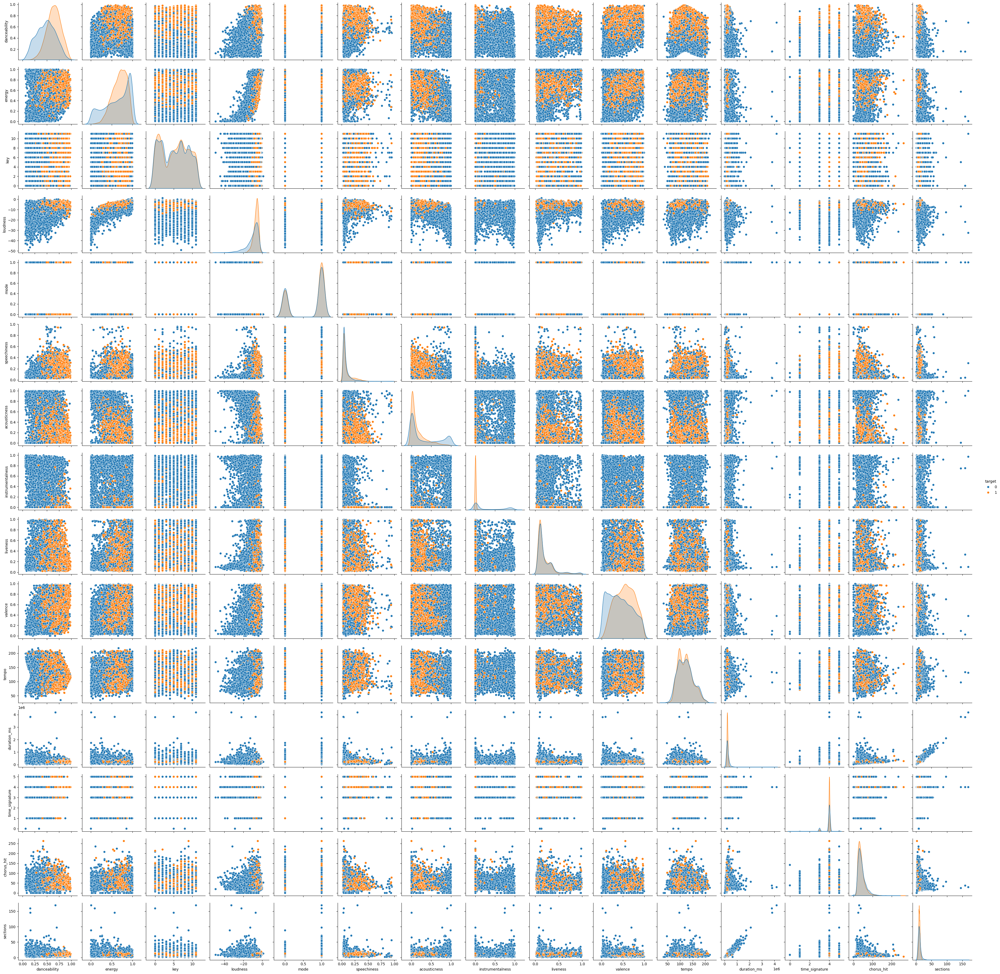

In [13]:
# Visulizar graficamente a relação entre as variaveis 
sns.pairplot(df, hue='target')

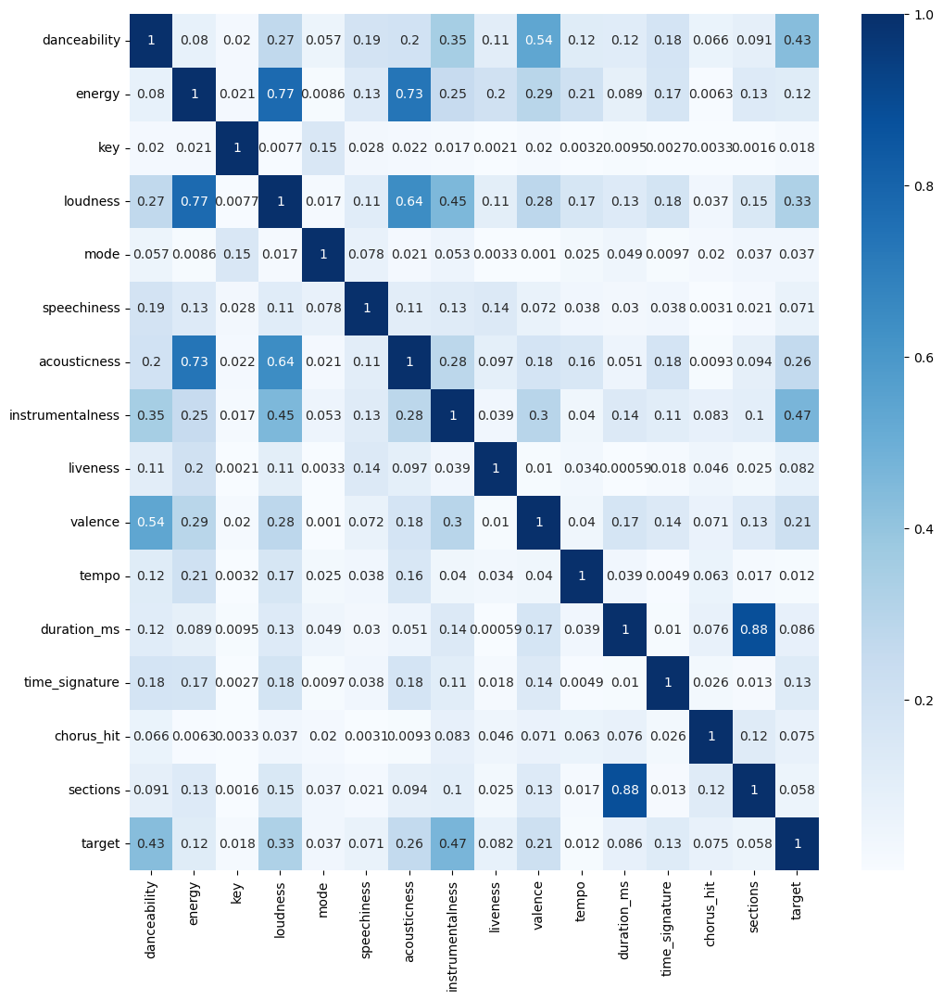

In [14]:
#Ver a correlação entre as variaveis 
corr = df.select_dtypes('number').corr()

fig, ax = plt.subplots(figsize=(12,12))
sns.heatmap(corr.abs(), cmap='Blues', annot=True)
plt.show()

## Separação as Features e Target

In [15]:
# Visualizar o nome das colunas do df
df.columns

Index(['track', 'artist', 'uri', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'duration_ms', 'time_signature', 'chorus_hit',
       'sections', 'target'],
      dtype='object')

In [16]:
#Separa as features e o target
features = ['danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'duration_ms', 'time_signature', 'chorus_hit',
       'sections']

target = ['target']

In [17]:
#Definindo o X e y
X = df[features]
y =df[target]

In [18]:
#Separando os dados de teste, treinamento e validação
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [19]:
#Separando os dados de validação. Para isso, dividimos os dados teste por 2
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.5, random_state=42)

## Pré - Processamento

In [20]:
from sklearn.preprocessing import MinMaxScaler

In [21]:
# Vamos normalizar o dataset
scaler = MinMaxScaler()
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X.columns)
X_train.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections
0,0.535760,0.639549,0.090909,0.861556,1.0,0.259698,0.059639,0.000000,0.107582,0.184739,0.740828,0.060523,0.8,0.117705,0.083333
1,0.127531,0.043403,0.818182,0.314572,0.0,0.026185,0.940763,0.000095,0.081865,0.036145,0.211072,0.057243,0.6,0.125724,0.059524
2,0.599311,0.543429,0.454545,0.817188,1.0,0.379310,0.007791,0.000033,0.379098,0.486948,0.778995,0.051693,0.8,0.176967,0.053571
3,0.717794,0.772716,0.545455,0.878507,0.0,0.174569,0.248996,0.000000,0.302254,0.348394,0.312068,0.035837,0.8,0.147469,0.041667
4,0.328953,0.408260,0.818182,0.736215,0.0,0.005711,0.185743,0.000003,0.102459,0.272088,0.268724,0.038969,0.8,0.138027,0.041667


In [22]:
X_test = pd.DataFrame(scaler.fit_transform(X_test), columns=X.columns)
X_test.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections
0,0.669996,0.822644,0.727273,0.889054,1.0,0.074046,0.096181,0.000000,0.061639,0.392675,0.197813,0.092325,0.75,0.223029,0.093750
1,0.600521,0.737472,0.545455,0.897909,1.0,0.010930,0.048241,0.000000,0.180566,0.520855,0.360728,0.080367,0.75,0.190838,0.083333
2,0.376900,0.746490,0.909091,0.832274,1.0,0.031719,0.405025,0.082175,0.298664,0.600203,0.273466,0.203745,0.75,0.259645,0.187500
3,0.689535,0.664325,0.181818,0.907376,1.0,0.029147,0.642211,0.000000,0.078939,0.687691,0.291689,0.127167,0.75,0.218461,0.114583
4,0.138081,0.058808,0.181818,0.491828,1.0,0.024111,0.973869,0.916415,0.099762,0.072838,0.515160,0.132495,0.75,0.110268,0.135417


## Regressão Logística

In [23]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

In [45]:
model_RL = LogisticRegression(random_state=42)
model_RL.fit(X_train, y_train)
y_pred_RL = model_RL.predict(X_test)

c:\Users\Mauro Jorge Ernesto\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [48]:
print(classification_report(y_test, y_pred_RL))

              precision    recall  f1-score   support

           0       0.88      0.67      0.76      1302
           1       0.73      0.91      0.81      1303

    accuracy                           0.79      2605
   macro avg       0.81      0.79      0.79      2605
weighted avg       0.81      0.79      0.79      2605



## Arvore de decisão

In [39]:
from sklearn.tree import DecisionTreeClassifier

In [40]:
model_tree = DecisionTreeClassifier(random_state=42, criterion='entropy')

model_tree.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', random_state=42)

In [49]:
y_tree_pred = model_tree.predict(X_test)
print(classification_report(y_test, y_tree_pred))

              precision    recall  f1-score   support

           0       0.65      0.78      0.71      1302
           1       0.73      0.57      0.64      1303

    accuracy                           0.68      2605
   macro avg       0.69      0.68      0.68      2605
weighted avg       0.69      0.68      0.68      2605



## Random Forest

In [31]:
from sklearn.ensemble import RandomForestClassifier

In [32]:
model_RF = RandomForestClassifier(random_state=42, n_estimators=50)

model_RF.fit(X_train, y_train)

c:\Users\Mauro Jorge Ernesto\anaconda3\Lib\site-packages\sklearn\base.py:1474: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier(n_estimators=50, random_state=42)

In [33]:
y_RF_pred = model_RF.predict(X_test)

print(classification_report(y_test, y_RF_pred))

              precision    recall  f1-score   support

           0       0.70      0.86      0.77      1302
           1       0.82      0.63      0.71      1303

    accuracy                           0.74      2605
   macro avg       0.76      0.74      0.74      2605
weighted avg       0.76      0.74      0.74      2605



## XGBOOST

In [42]:
from xgboost import XGBClassifier

In [43]:
model_XGB = XGBClassifier(random_state=42)
model_XGB.fit(X_train, y_train)
y_pred_XGB = model_XGB.predict(X_test)

In [44]:
print(classification_report(y_test, y_pred_XGB))

              precision    recall  f1-score   support

           0       0.67      0.89      0.76      1302
           1       0.84      0.56      0.67      1303

    accuracy                           0.72      2605
   macro avg       0.75      0.72      0.72      2605
weighted avg       0.75      0.72      0.72      2605



## Apresentar o resultados dos modelos no gráfico

In [51]:
models = ['Regressão Logística', 'Decision Tree', 'Random Forest', 'XGBoost']
accuracies = [0.79, 0.68, 0.74, 0.72]

# Criar o gráfico de barras
fig = px.bar(x=models, y=accuracies, labels={'x': 'Models', 'y': 'Accuracy'},
             title="Performance of the models", text=accuracies)

# Personalizar o layout
fig.update_traces(texttemplate='%{text:.2f}%', textposition='outside', marker_color='green')

# Mostrar o gráfico
fig.show()

## Otimizando os modelos com os melhores hiperparâmetros

In [52]:
from sklearn.model_selection import GridSearchCV

## árvore de decisão

In [55]:
# Dicionário de métricas
scoring = {
    'accuracy': 'accuracy',
    'precision_macro': 'precision_macro',
    'recall_macro': 'recall_macro',
    'f1_macro': 'f1_macro'
}

# Parâmetros para grid search
params_Tree = {
    'max_depth': [3, 5, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}

# Definindo o GridSearch com múltiplas métricas
grid = GridSearchCV(
    estimator=DecisionTreeClassifier(),
    param_grid=params_Tree,
    scoring=scoring,
    refit='f1_macro',  # Refit será feito com base no F1-score macro
    cv=10,
    verbose=1,
    n_jobs=-1
)

grid.fit(X_train, y_train)

# Resultados
print("Melhores hiperparâmetros:", grid.best_params_)
print("Melhor F1-macro score:", grid.best_score_)

Fitting 10 folds for each of 72 candidates, totalling 720 fits
Melhores hiperparâmetros: {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2}
Melhor F1-macro score: 0.8045808026088549


## Random Forest

In [57]:
param_RF = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    #'max_features': ['sqrt', 'log2'],
    #'bootstrap': [True, False],
    #'criterion': ['gini', 'entropy']
}

grid_RF = GridSearchCV(
    estimator=RandomForestClassifier(random_state=42),
    param_grid=param_RF,
    scoring='f1_macro',
    cv=5,
    n_jobs=-1,
    verbose=1
)

grid_RF.fit(X_train, y_train)

print("Melhores parâmetros:", grid.best_params_)
print("Melhor f1_macro score:", grid.best_score_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


c:\Users\Mauro Jorge Ernesto\anaconda3\Lib\site-packages\sklearn\base.py:1474: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



Melhores parâmetros: {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2}
Melhor f1_macro score: 0.8045808026088549


## XGBoost

In [58]:
param_grid_XGB = {
    'learning_rate': [0.01, 0.05, 0.1, 0.2],  # Taxa de aprendizado pequena a moderada
    'max_depth': [3, 5, 7, 10],               # Profundidade da árvore, mais profunda aumenta a complexidade
    'n_estimators': [50, 100, 200, 300],       # Número de árvores no modelo
    'subsample': [0.6, 0.8, 1.0]               # Proporção de amostras para cada árvore
}

grid_search_XGB = GridSearchCV(model_XGB,
    param_grid_XGB,
    scoring='f1_macro',
    cv=5,
    n_jobs=-1,
    verbose=1)
grid_search_XGB.fit(X_train, y_train)

print('Melhores hiperparâmetros:', grid_search_XGB.best_params_)
print('Melhor f1_macro score::', grid_search_XGB.best_score_)

Fitting 5 folds for each of 192 candidates, totalling 960 fits
Melhores hiperparâmetros: {'learning_rate': 0.05, 'max_depth': 7, 'n_estimators': 300, 'subsample': 0.8}
Melhor f1_macro score:: 0.8391047466458028


## Apresentar o resultados dos modelos no gráfico após a otimização dos hiperparâmetros

In [59]:
models = ['Regressão Logística', 'Decision Tree', 'Random Forest', 'XGBoost']
accuracies = [0.79, 0.80, 0.80, 0.83]

# Criar o gráfico de barras
fig = px.bar(x=models, y=accuracies, labels={'x': 'Models', 'y': 'Accuracy'},
             title="Performance of the models", text=accuracies)

# Personalizar o layout
fig.update_traces(texttemplate='%{text:.2f}%', textposition='outside', marker_color='green')

# Mostrar o gráfico
fig.show()